# <p style="background-color:green;font-family:newtimeroman;font-size:200%;color:white;text-align:center;border-radius:20px 20px;"><b>Adult Income Prediction Project Solution</b></p>
![](https://www.techproeducation.com/logo/headerlogo.svg)

<b>If you want to be the first to know about the latest updates, please don't forget to follow us. </b>[YouTube](https://www.youtube.com/c/techproeducation) | [Instagram](https://www.instagram.com/techproeducation) | [Facebook](https://www.facebook.com/techproeducation) | [Telegram](https://t.me/joinchat/HH2qRvA-ulh4OWbb) | [Whatsapp](https://api.whatsapp.com/send/?phone=%2B15853042959&text&type=phone_number&app_absent=0) | [LinkedIn](https://www.linkedin.com/company/techproeducation/mycompany/) |

# Adult Income Prediction

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.

**Attribute Information:**

**Age**: Describes the age of individuals. Continuous.

**Workclass**: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

**fnlwgt**: Continuous value. This is a weighting factor created by the U.S. Census Bureau, indicating the number of people that each data entry represents. For example, if the fnlwgt value for a data entry is 100, it means that this data entry is considered to represent 100 people.

However, this feature is not typically used directly in analyses or model training because these weights don't have a direct significance on individual data points when training or testing models. Nonetheless, these weight values can be useful if a more in-depth demographic analysis of the dataset is being conducted.

**education**: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

**education-num**: Number of years spent in education. Continuous.

**marital-status**: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

**occupation**: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

**relationship**: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

**race**: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

**sex**: Female, Male.

**capital-gain**: Represents the profit an individual makes from the sale of assets (e.g., stock or real estate sales). Continuous.

**capital-loss**: Represents the loss an individual incurs from the sale of assets (e.g., stock or real estate sales). Continuous.

**hours-per-week**: Continuous.

**native-country**: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

**salary**: >50K,<=50K.


# Import libraries

In [1]:
# Libraries for EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
cf.go_offline()

# For showing the plots
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 6

# ML, Data preprocessing and evaluation families of sklearn library
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, auc

# to ignore the warnings
import warnings

warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Exploratory Data Analysis and Visualization

In [2]:
df = pd.read_csv("adult.csv") 

In [3]:
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
# To obtain a general profile of the dataset:
# - Number of observations, data type, number of null values, number of unique values, min-max values
# - Null values are appearing as "0"!

def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(df)

Data shape: (32561, 15)
___________________________
Data Types:
Types
object    9
int64     6
Name: count, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
age,int64,32561,73,0,17,90
capital.gain,int64,32561,119,0,0,99999
capital.loss,int64,32561,92,0,0,4356
education,object,32561,16,0,10th,Some-college
education.num,int64,32561,16,0,1,16
fnlwgt,int64,32561,21648,0,12285,1484705
hours.per.week,int64,32561,94,0,1,99
income,object,32561,2,0,<=50K,>50K
marital.status,object,32561,7,0,Divorced,Widowed
native.country,object,32561,42,0,?,Yugoslavia


In [5]:
# Checks for duplicate observations in the dataset and drops them.

def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [6]:
duplicate_values(df)

Duplicate check...
There are 24 duplicated observations in the dataset.
24 duplicates were dropped!
No more duplicate rows!


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
fnlwgt,32537.0,189780.848511,105556.471009,12285.0,117827.0,178356.0,236993.0,1484705.0
education.num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
capital.gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
capital.loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0


In [8]:
df.describe(include="object").T

,count,unique,top,freq
workclass,32537,9,Private,22673
education,32537,16,HS-grad,10494
marital.status,32537,7,Married-civ-spouse,14970
occupation,32537,15,Prof-specialty,4136
relationship,32537,6,Husband,13187
race,32537,5,White,27795
sex,32537,2,Male,21775
native.country,32537,42,United-States,29153
income,32537,2,<=50K,24698


## Missing Value Control 

In [9]:
# Detects null values in the dataset and lists them by count and percentage.

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending = False)
    missing_percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending = False)
    missing_values = pd.concat([missing_number, missing_percent], axis = 1, keys = ['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number'] > 0]

In [10]:
missing_values(df)

,Missing_Number,Missing_Percent


In [11]:
# Convert/Change all the '?' values in the dataset to NaN

df.replace(to_replace='?',value=np.nan,inplace=True)

#df=df.applymap(lambda x: np.nan if x=='?' else x)

In [12]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
workclass,1836,0.056428
native.country,582,0.017887


### workclass 

In [13]:
df['workclass'].value_counts(normalize=True)

workclass
Private             0.738510
Self-emp-not-inc    0.082733
Local-gov           0.068174
State-gov           0.042279
Self-emp-inc        0.036351
Federal-gov         0.031269
Without-pay         0.000456
Never-worked        0.000228
Name: proportion, dtype: float64

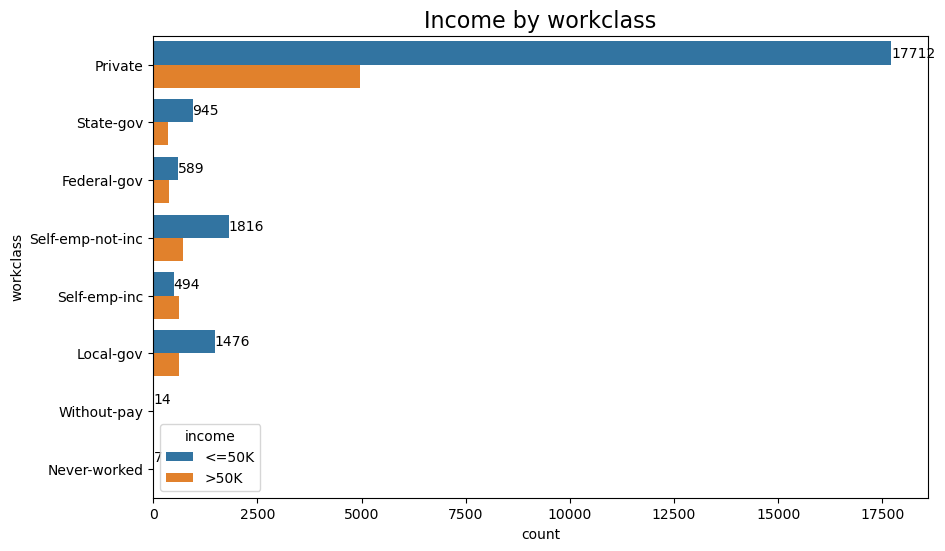

In [14]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['workclass'], hue = df['income'])
plt.title("Income by workclass", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [15]:
df['workclass'] = df['workclass'].fillna('Private')

In [16]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
native.country,582,0.017887


### occupation

In [17]:
df['occupation'].value_counts(normalize=True)

occupation
Prof-specialty       0.134749
Craft-repair         0.133381
Exec-managerial      0.132436
Adm-clerical         0.122760
Sales                0.118916
Other-service        0.107220
Machine-op-inspct    0.065159
Transport-moving     0.052030
Handlers-cleaners    0.044602
Farming-fishing      0.032319
Tech-support         0.030201
Protective-serv      0.021144
Priv-house-serv      0.004789
Armed-Forces         0.000293
Name: proportion, dtype: float64

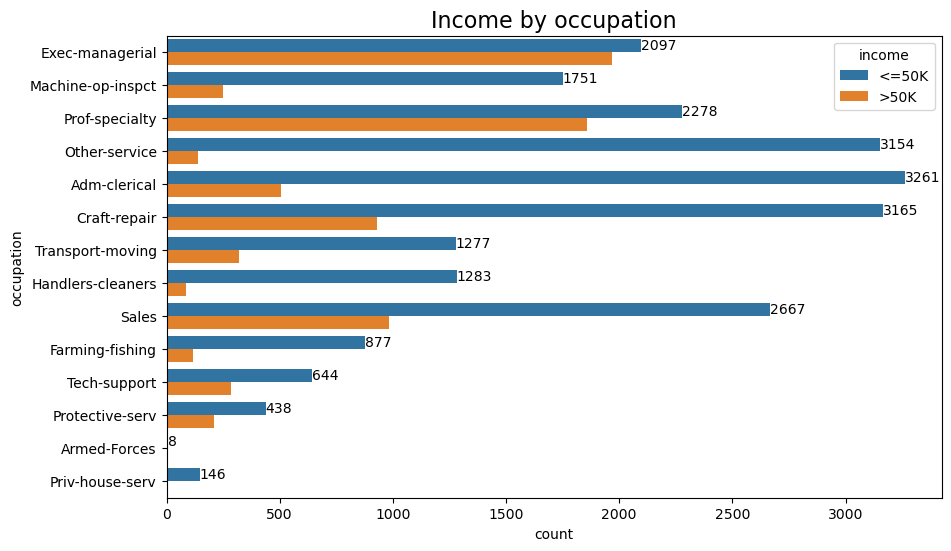

In [18]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['occupation'], hue = df['income'])
plt.title("Income by occupation", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [19]:
df['occupation'] = df['occupation'].fillna(method='bfill')

# bfill (backward fill), fills the null values with the next value. 
# ffill (forward fill), fills the null values with the previous value. 

In [20]:
missing_values(df)

,Missing_Number,Missing_Percent
native.country,582,0.017887


### native country 

In [21]:
df['native.country'].value_counts(normalize=True)

native.country
United-States                 0.912314
Mexico                        0.019997
Philippines                   0.006196
Germany                       0.004287
Canada                        0.003787
Puerto-Rico                   0.003568
El-Salvador                   0.003317
India                         0.003129
Cuba                          0.002973
England                       0.002816
Jamaica                       0.002535
South                         0.002504
China                         0.002347
Italy                         0.002284
Dominican-Republic            0.002191
Vietnam                       0.002097
Guatemala                     0.001940
Japan                         0.001940
Poland                        0.001878
Columbia                      0.001846
Taiwan                        0.001596
Haiti                         0.001377
Iran                          0.001346
Portugal                      0.001158
Nicaragua                     0.001064
Peru      

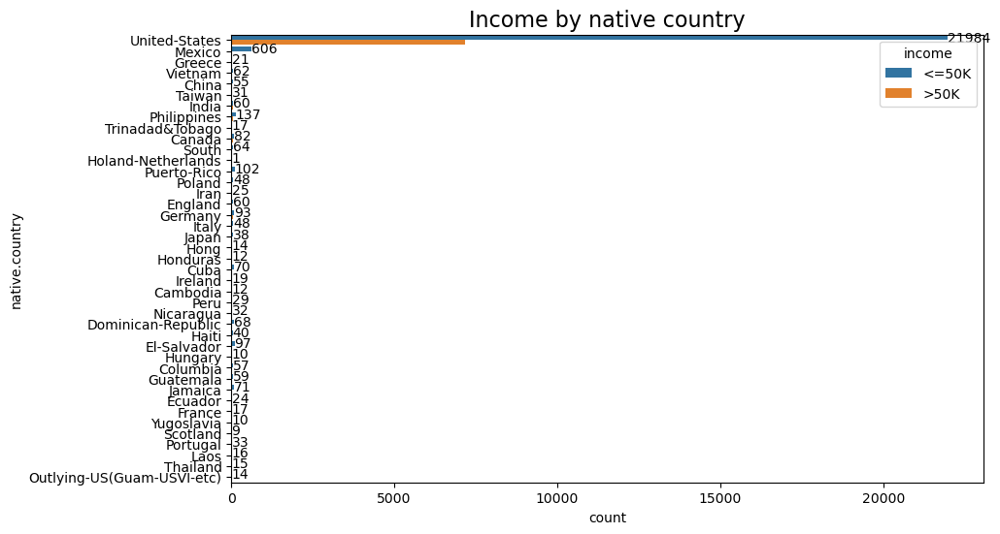

In [22]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['native.country'], hue = df['income'])
plt.title("Income by native country", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [23]:
df['native.country'] = df['native.country'].fillna('United-States')

In [24]:
missing_values(df)

,Missing_Number,Missing_Percent


## Target Variable

In [25]:
# To quickly examine the distribution of values in a specific column of the dataset

def value_cnt(df, column_name):
    vc = df[column_name].value_counts()
    vc_norm = df[column_name].value_counts(normalize=True)

    vc = vc.rename_axis(column_name).reset_index(name='counts')
    vc_norm = vc_norm.rename_axis(column_name).reset_index(name='norm_counts')

    df_result = pd.concat([vc[column_name], vc['counts'], vc_norm['norm_counts']], axis=1)
    
    return df_result

In [26]:
print(df.income.value_counts())
print("---------------------")
print(df.income.value_counts(normalize=True))

income
<=50K    24698
>50K      7839
Name: count, dtype: int64
---------------------
income
<=50K    0.759074
>50K     0.240926
Name: proportion, dtype: float64


In [27]:
# income_distr =df['income'].value_counts().reset_index()
# fig = px.pie(income_distr, values='income', names='index')
# fig.update_layout(title="Income Distribution")
# fig.show()

In [28]:
income_distr = df['income'].value_counts().reset_index()
income_distr.columns = ['index', 'income']  # change the column names
fig = px.pie(income_distr, values='income', names='index')
fig.update_layout(title="Income Distribution")
fig.show()

In [29]:
# sns.heatmap(df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

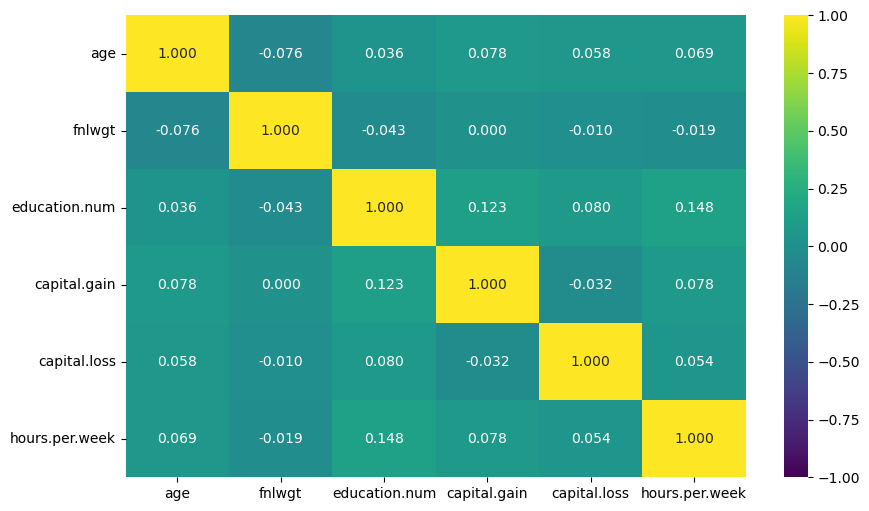

In [30]:
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

In [31]:
df['income']=df['income'].map({'<=50K': 0, '>50K': 1})

In [32]:
df.sample(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1380,53,Private,150393,HS-grad,9,Never-married,Craft-repair,Not-in-family,White,Male,0,1504,35,United-States,0
16125,34,Private,532379,Some-college,10,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,0
16466,25,Private,212311,Some-college,10,Never-married,Adm-clerical,Unmarried,Black,Female,0,0,40,United-States,0
6718,71,Private,235079,Preschool,1,Widowed,Craft-repair,Unmarried,Black,Male,0,0,10,United-States,0
18164,26,State-gov,169323,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,40,United-States,0


In [33]:
# sns.heatmap(df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

<Axes: >

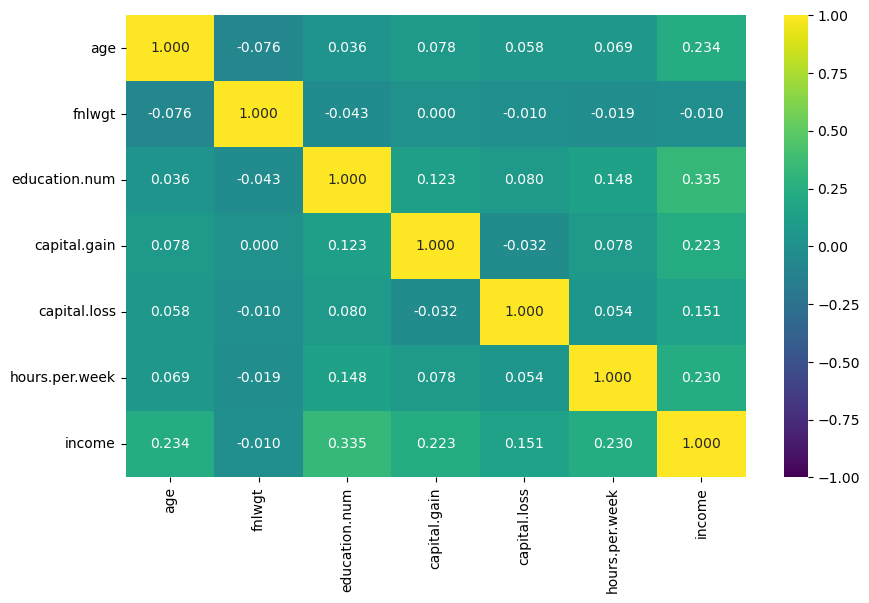

In [34]:
numeric_cols = df.select_dtypes(include=[np.number])  
sns.heatmap(numeric_cols.corr(), vmin=-1, vmax=1, annot=True, fmt='.3f', cmap='viridis')

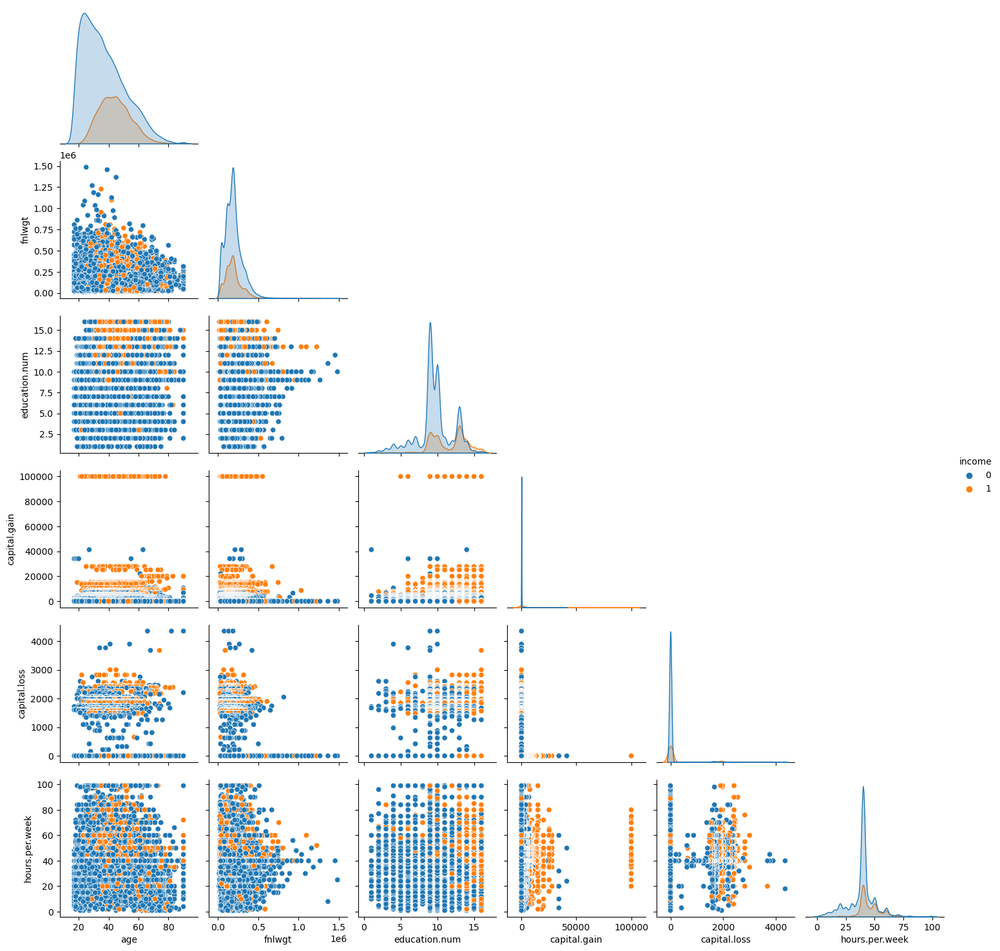

In [35]:
sns.pairplot(df, hue = "income", corner=True);

## Age

In [36]:
px.histogram(df, x='age', color="income", barmode='group', title='Income Distribution by Age')

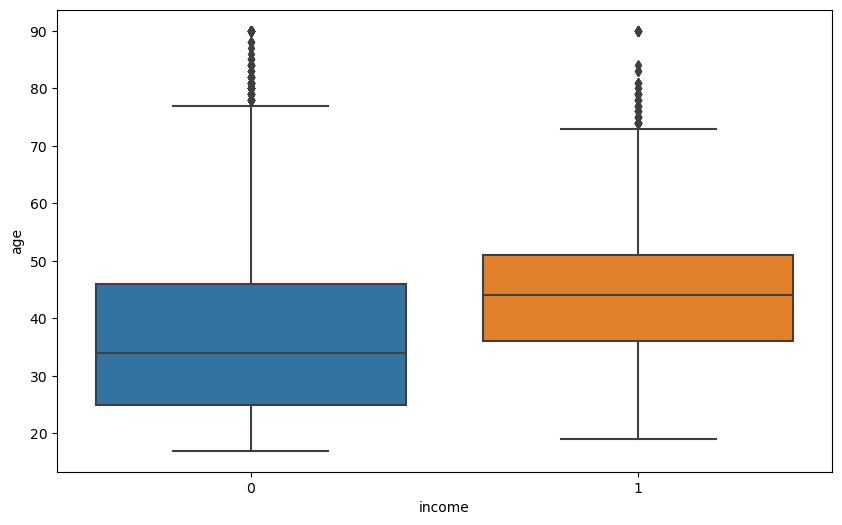

In [37]:
 sns.boxplot(data=df,y="age",x='income');

## Work Class 

In [38]:
value_cnt(df, 'workclass')

,workclass,counts,norm_counts
0,Private,24509,0.753266
1,Self-emp-not-inc,2540,0.078065
2,Local-gov,2093,0.064327
3,State-gov,1298,0.039893
4,Self-emp-inc,1116,0.034299
5,Federal-gov,960,0.029505
6,Without-pay,14,0.000430
7,Never-worked,7,0.000215


In [39]:
px.histogram(df, x='workclass', color="income", barmode='group', title='Income Distribution by Work Class')

## fnlwgt 

In [40]:
px.histogram(df, x='fnlwgt', color="income", barmode='group', title='Income Distribution by fnlwgt')

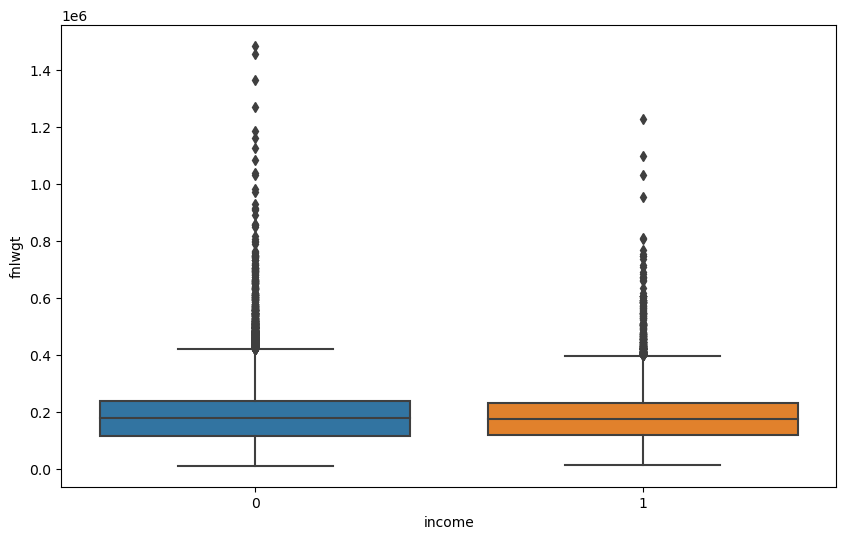

In [41]:
sns.boxplot(data=df,y="fnlwgt",x='income');

In [42]:
df.drop(['fnlwgt'], axis = 1, inplace = True)

## Education and Education Num

In [43]:
value_cnt(df, 'education')

,education,counts,norm_counts
0,HS-grad,10494,0.322525
1,Some-college,7282,0.223807
2,Bachelors,5353,0.164520
3,Masters,1722,0.052924
4,Assoc-voc,1382,0.042475
5,11th,1175,0.036113
6,Assoc-acdm,1067,0.032793
7,10th,933,0.028675
8,7th-8th,645,0.019824
9,Prof-school,576,0.017703


In [44]:
df['education'].replace(['11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', '12th'], 'School', inplace = True)

In [45]:
px.histogram(df, x='education', color=df.income, barmode='group', title='Income Distribution by Education Level')

In [46]:
px.histogram(df, x='education.num', color="income", barmode='group', title='Income Distribution by Education Num')

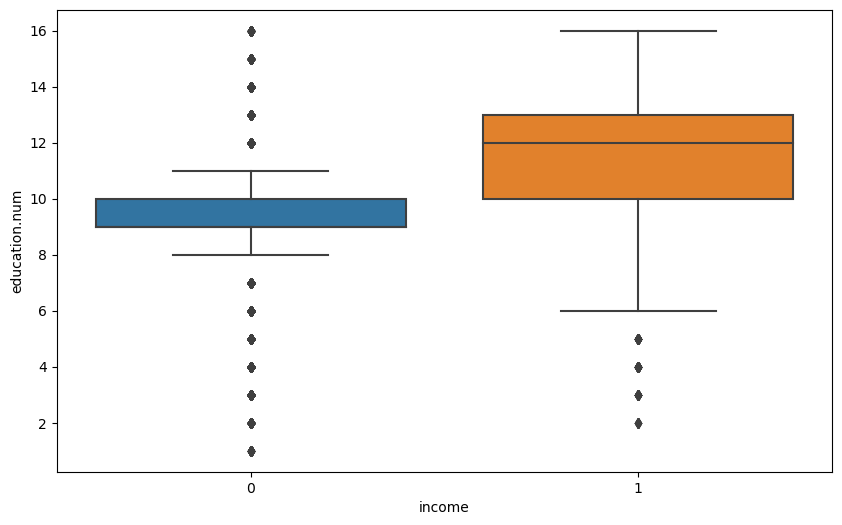

In [47]:
sns.boxplot(data=df,y="education.num",x='income');

## Marital Status

In [48]:
value_cnt(df, 'marital.status')

,marital.status,counts,norm_counts
0,Married-civ-spouse,14970,0.460092
1,Never-married,10667,0.327842
2,Divorced,4441,0.136491
3,Separated,1025,0.031503
4,Widowed,993,0.030519
5,Married-spouse-absent,418,0.012847
6,Married-AF-spouse,23,0.000707


In [49]:
px.histogram(df, x='marital.status', color="income", barmode='group', title='Income Distribution by Marital Status')

## Occupation

In [50]:
value_cnt(df, 'occupation')

,occupation,counts,norm_counts
0,Prof-specialty,4394,0.135046
1,Craft-repair,4326,0.132956
2,Exec-managerial,4274,0.131358
3,Adm-clerical,3989,0.122599
4,Sales,3860,0.118634
5,Other-service,3516,0.108062
6,Machine-op-inspct,2126,0.065341
7,Transport-moving,1685,0.051787
8,Handlers-cleaners,1464,0.044995
9,Farming-fishing,1069,0.032855


In [51]:
px.histogram(df, x='occupation', color="income", barmode='group', title='Income Distribution by Occupation')

## Relationship

In [52]:
value_cnt(df, 'relationship')

,relationship,counts,norm_counts
0,Husband,13187,0.405292
1,Not-in-family,8292,0.254848
2,Own-child,5064,0.155638
3,Unmarried,3445,0.105879
4,Wife,1568,0.048191
5,Other-relative,981,0.030150


In [53]:
px.histogram(df, x='relationship', color="income", barmode='group', title='Income Distribution by Relationship')

## Race

In [54]:
value_cnt(df, 'race')

,race,counts,norm_counts
0,White,27795,0.854258
1,Black,3122,0.095952
2,Asian-Pac-Islander,1038,0.031902
3,Amer-Indian-Eskimo,311,0.009558
4,Other,271,0.008329


In [55]:
df['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other'],' Others', inplace = True)

In [56]:
px.histogram(df, x='race', color="income", barmode='group', title='Income Distribution by Race')

## Sex

In [57]:
value_cnt(df, 'sex')

,sex,counts,norm_counts
0,Male,21775,0.669238
1,Female,10762,0.330762


In [58]:
px.histogram(df, x='sex', color="income", barmode='group', title='Income Distribution by Sex')

## Capital Gain and Loss

In [59]:
px.histogram(df, x='capital.gain', color="income", barmode='group', title='Income Distribution by Capital Gain')

In [60]:
px.histogram(df, x='capital.loss', color="income", barmode='group', title='Income Distribution by Capital Loss')

In [61]:
df['capital_diff'] = df['capital.gain'] - df['capital.loss']
df['capital_diff'] = pd.cut(df['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
df['capital_diff'] = df['capital_diff'].astype('object')
df.drop(['capital.gain'], axis = 1, inplace = True)
df.drop(['capital.loss'], axis = 1, inplace = True)

Divides the 'Capital Diff' column into two categories ('Minor' and 'Major').

The values in the 'Capital Diff' column are categorized by cutting them within specified boundaries.

These boundaries are set using the bins parameter.

Values between -5000 and 5000 are assigned to the 'Minor' category, while values between 5000 and 100000 are assigned to the 'Major' category.

**Objective:**

"To simplify the dataframe by combining the information from the capital.gain and capital.loss columns into a single categorical column, categorizing whether the total gain/loss obtained from these two columns is low or high."

In [62]:
value_cnt(df, 'capital_diff')

,capital_diff,counts,norm_counts
0,Low,30889,0.94935
1,High,1648,0.05065


In [63]:
px.histogram(df, x='capital_diff', color="income", barmode='group', title='Income Distribution by Capital Diff')

## Hours per Week

In [64]:
px.histogram(df, x='hours.per.week', color="income", barmode='group', title='Income Distribution by Hours per Week')

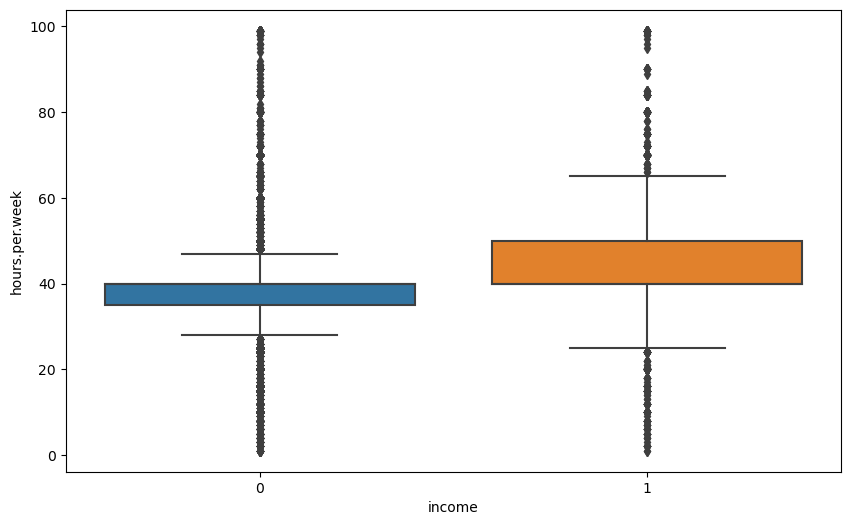

In [65]:
sns.boxplot(data=df,y="hours.per.week",x='income');

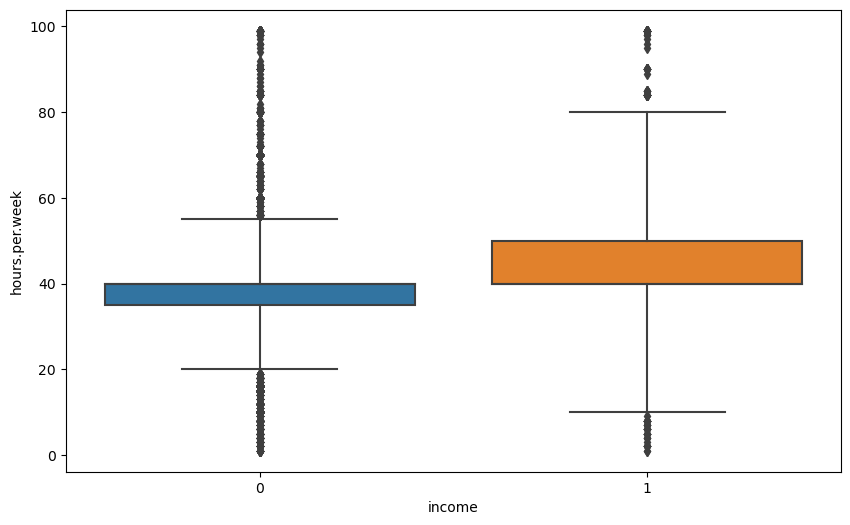

In [66]:
sns.boxplot(data=df,y="hours.per.week",x='income', whis=3);

In [67]:
# tho total number of people working more than 72 hours per week

len(df[df["hours.per.week"]>72])  

427

In [68]:
# the number of people working less than 20 hrs per week

len(df[df["hours.per.week"]<20])  

1700

In [69]:
# the total number of people working more than 72 and less than 20 hrs per week

len(df[(df["hours.per.week"] > 72) | (df["hours.per.week"] < 20)])

2127

In [70]:
df = df[~((df["hours.per.week"] > 72) | (df["hours.per.week"] < 20))]

In [71]:
df.shape

(30410, 13)

## Native Country

In [72]:
value_cnt(df, 'native.country')

,native.country,counts,norm_counts
0,United-States,27762,0.912923
1,Mexico,613,0.020158
2,Philippines,186,0.006116
3,Germany,127,0.004176
4,Canada,113,0.003716
5,Puerto-Rico,109,0.003584
6,El-Salvador,100,0.003288
7,India,95,0.003124
8,Cuba,90,0.002960
9,England,84,0.002762


In [73]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [74]:
df['native.country'].loc[df['native.country'] != 'United-States'] = 'Others'

In [75]:
value_cnt(df, 'native.country')

,native.country,counts,norm_counts
0,United-States,27762,0.912923
1,Others,2648,0.087077


In [76]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [77]:
df1 = df.copy()

In [78]:
df.to_excel('son.xlsx', index=False)

In [79]:
df = pd.read_excel('son.xlsx')

# Data Pre-Processing

## Train | Test Split

In [80]:
X= df.drop(columns="income")
y= df.income

In [81]:
# using stratify=y as the data is unbalanced

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=101)

- Preschool: Preschool education
- School: Primary or secondary education
- HS-grad: High school graduate
- Some-college: Attended college but did not complete
- Assoc-voc: Vocational education diploma
- Assoc-acdm: Academic education diploma
- Bachelors: Bachelor's degree
- Masters: Master's degree
- Prof-school: Professional school (e.g., Law or Medical school)
- Doctorate: Doctorate degree

In [82]:
cat_onehot = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'marital.status']
cat_ordinal = ['education', 'capital_diff']
    
cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']

In [83]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

column_trans = make_column_transformer((OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot), 
                                       (OrdinalEncoder(categories= [cat_for_edu, cat_for_capdiff]), cat_ordinal),
                                       remainder='passthrough') # MinMaxScaler()


# The `make_column_transformer` function automates transformations applied to features. It applies transformations 
# to features sequentially according to the order specified within this function.

# What does the code `(OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot)` do?
# With the `handle_unknown = "ignore"` parameter, it performs one-hot encoding on all features listed in `cat_onehot`, 
# converting any categorical data in the test set that does not appear in the train set to zeros.

# What does the code `(OrdinalEncoder(categories=categories), cat_ordinal)` do?
# After applying one-hot encoding to the relevant features, it applies ordinal encoding to all features in `cat_ordinal` 
# based on the hierarchical order of unique categorical observations in the `categories` list.

# `remainder='passthrough'` means leaving all other features that are not transformed as they are. If `remainder` is 
# left as the default value "drop," all features not subjected to transformation will be dropped from the dataframe.
# If `remainder` is set to `MinMaxScaler()` or `StandardScaler()`, scaling will be applied to all features except 
# those that were not transformed.

Here's the explanation of each component in the `make_column_transformer` function:

- **`OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot`**: 
  This part applies one-hot encoding to all features listed in `cat_onehot`. The `handle_unknown="ignore"` parameter ensures that any unknown categories (those present in the test set but not in the training set) are represented as all zeros. The `sparse=False` parameter specifies that the output should be a dense array rather than a sparse matrix.

- **`OrdinalEncoder(categories=categories), cat_ordinal`**:
  After one-hot encoding, this part applies ordinal encoding to all features listed in `cat_ordinal`. The `categories` parameter specifies the hierarchical order of categories, and each feature in `cat_ordinal` will be encoded based on this order.

- **`remainder='passthrough'`**:
  This option means that all features not specified in the transformations will be left unchanged. If `remainder` is set to the default value of `"drop"`, all features that are not transformed will be removed from the dataframe.

- **`remainder=MinMaxScaler()` or `StandardScaler()`**:
  If you use `MinMaxScaler()` or `StandardScaler()` for the `remainder`, then all features that are not transformed by the specified transformers will be scaled using the selected scaler.

In [84]:
X_train.head()

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,capital_diff
6967,61,Private,School,6,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,40,United-States,Low
1836,40,Self-emp-inc,Assoc-acdm,12,Married-civ-spouse,Sales,Husband,White,Male,50,United-States,High
10104,22,Private,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,40,United-States,Low
22388,34,Private,Assoc-voc,11,Married-civ-spouse,Adm-clerical,Husband,Black,Male,45,United-States,Low
21041,20,Private,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,40,United-States,Low


In [85]:
X_test.head()

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,capital_diff
14302,48,Private,HS-grad,9,Widowed,Other-service,Unmarried,White,Female,25,United-States,Low
28921,31,Local-gov,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,Black,Male,40,United-States,Low
17335,35,Private,HS-grad,9,Divorced,Sales,Not-in-family,White,Female,30,United-States,Low
7358,43,Private,Some-college,10,Divorced,Transport-moving,Not-in-family,White,Male,45,United-States,Low
25137,33,Private,HS-grad,9,Never-married,Craft-repair,Not-in-family,White,Male,40,United-States,Low


In [86]:
X_train.shape, X_test.shape

((24328, 12), (6082, 12))

In [87]:
column_trans.fit_transform(X_train)

array([[ 0.,  0.,  0., ..., 61.,  6., 40.],
       [ 0.,  0.,  0., ..., 40., 12., 50.],
       [ 0.,  0.,  0., ..., 22.,  9., 40.],
       ...,
       [ 0.,  0.,  0., ..., 25., 10., 50.],
       [ 0.,  0.,  0., ..., 22., 10., 30.],
       [ 0.,  0.,  0., ..., 30.,  7., 40.]])

In [88]:
X_train_trans = column_trans.fit_transform(X_train) 
X_test_trans = column_trans.transform(X_test)

In [89]:
X_train_trans.shape, X_test_trans.shape

((24328, 47), (6082, 47))

In [90]:
X_train_trans

array([[ 0.,  0.,  0., ..., 61.,  6., 40.],
       [ 0.,  0.,  0., ..., 40., 12., 50.],
       [ 0.,  0.,  0., ..., 22.,  9., 40.],
       ...,
       [ 0.,  0.,  0., ..., 25., 10., 50.],
       [ 0.,  0.,  0., ..., 22., 10., 30.],
       [ 0.,  0.,  0., ..., 30.,  7., 40.]])

In [91]:
column_trans.get_feature_names_out()

array(['onehotencoder__workclass_Federal-gov',
       'onehotencoder__workclass_Local-gov',
       'onehotencoder__workclass_Never-worked',
       'onehotencoder__workclass_Private',
       'onehotencoder__workclass_Self-emp-inc',
       'onehotencoder__workclass_Self-emp-not-inc',
       'onehotencoder__workclass_State-gov',
       'onehotencoder__workclass_Without-pay',
       'onehotencoder__occupation_Adm-clerical',
       'onehotencoder__occupation_Armed-Forces',
       'onehotencoder__occupation_Craft-repair',
       'onehotencoder__occupation_Exec-managerial',
       'onehotencoder__occupation_Farming-fishing',
       'onehotencoder__occupation_Handlers-cleaners',
       'onehotencoder__occupation_Machine-op-inspct',
       'onehotencoder__occupation_Other-service',
       'onehotencoder__occupation_Priv-house-serv',
       'onehotencoder__occupation_Prof-specialty',
       'onehotencoder__occupation_Protective-serv',
       'onehotencoder__occupation_Sales',
       'onehotencod

In [92]:
features = column_trans.get_feature_names_out()

In [93]:
X_train= pd.DataFrame(X_train_trans, columns=features, index=X_train.index)
X_train.head()

,onehotencoder__workclass_Federal-gov,onehotencoder__workclass_Local-gov,onehotencoder__workclass_Never-worked,onehotencoder__workclass_Private,onehotencoder__workclass_Self-emp-inc,onehotencoder__workclass_Self-emp-not-inc,onehotencoder__workclass_State-gov,onehotencoder__workclass_Without-pay,onehotencoder__occupation_Adm-clerical,onehotencoder__occupation_Armed-Forces,...,onehotencoder__marital.status_Married-civ-spouse,onehotencoder__marital.status_Married-spouse-absent,onehotencoder__marital.status_Never-married,onehotencoder__marital.status_Separated,onehotencoder__marital.status_Widowed,ordinalencoder__education,ordinalencoder__capital_diff,remainder__age,remainder__education.num,remainder__hours.per.week
6967,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,61.0,6.0,40.0
1836,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,5.0,1.0,40.0,12.0,50.0
10104,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,22.0,9.0,40.0
22388,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,4.0,0.0,34.0,11.0,45.0
21041,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,3.0,0.0,20.0,10.0,40.0


In [94]:
X_test= pd.DataFrame(X_test_trans, columns=features, index=X_test.index)
X_test.head()

,onehotencoder__workclass_Federal-gov,onehotencoder__workclass_Local-gov,onehotencoder__workclass_Never-worked,onehotencoder__workclass_Private,onehotencoder__workclass_Self-emp-inc,onehotencoder__workclass_Self-emp-not-inc,onehotencoder__workclass_State-gov,onehotencoder__workclass_Without-pay,onehotencoder__occupation_Adm-clerical,onehotencoder__occupation_Armed-Forces,...,onehotencoder__marital.status_Married-civ-spouse,onehotencoder__marital.status_Married-spouse-absent,onehotencoder__marital.status_Never-married,onehotencoder__marital.status_Separated,onehotencoder__marital.status_Widowed,ordinalencoder__education,ordinalencoder__capital_diff,remainder__age,remainder__education.num,remainder__hours.per.week
14302,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,0.0,48.0,9.0,25.0
28921,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,2.0,0.0,31.0,9.0,40.0
17335,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,35.0,9.0,30.0
7358,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,43.0,10.0,45.0
25137,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,2.0,0.0,33.0,9.0,40.0


In [95]:
corr_by_income = X_train.join(y_train).corr()["income"].sort_values()[:-1]
corr_by_income

# To examine the correlations of all features in our data with the target, we join `X_train` and `y_train`.
# We then sort the correlations with our target, `price`, from smallest to largest. Since we do not want to see 
# the correlation of the target with itself, we perform slicing ([:-1]) to ignore the target's own correlation.

onehotencoder__marital.status_Never-married           -0.314213
onehotencoder__relationship_Own-child                 -0.221005
onehotencoder__sex_Female                             -0.210939
onehotencoder__relationship_Not-in-family             -0.193319
onehotencoder__occupation_Other-service               -0.158200
onehotencoder__relationship_Unmarried                 -0.147372
onehotencoder__marital.status_Divorced                -0.132096
onehotencoder__workclass_Private                      -0.127657
onehotencoder__occupation_Adm-clerical                -0.097735
onehotencoder__occupation_Handlers-cleaners           -0.091929
onehotencoder__race_Black                             -0.090854
onehotencoder__relationship_Other-relative            -0.083928
onehotencoder__occupation_Machine-op-inspct           -0.079637
onehotencoder__marital.status_Separated               -0.076641
onehotencoder__marital.status_Widowed                 -0.060090
onehotencoder__occupation_Farming-fishin

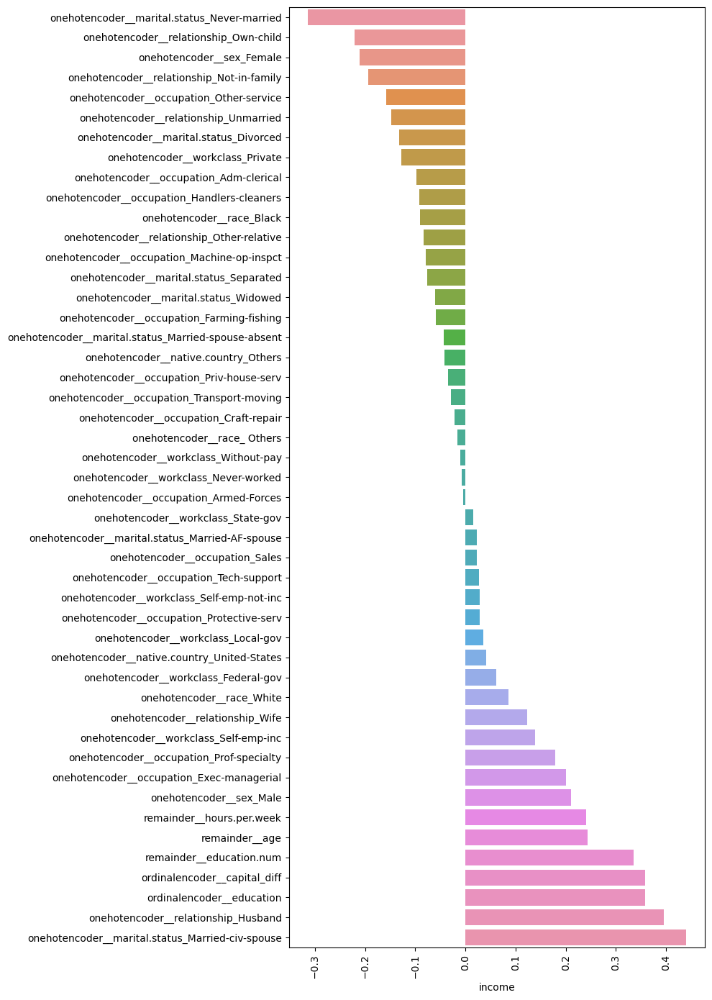

In [96]:
plt.figure(figsize = (10,14))
sns.barplot(y = corr_by_income.index, x = corr_by_income)
plt.xticks(rotation=90)
plt.tight_layout();

# visualizing the correlation between features with target variable

# Implement Logistic Regression

**Basic Concepts:**
Logistic regression is a statistical analysis method used to model the relationship between a dependent variable with binary outcomes (such as yes/no) and one or more independent variables. For instance, it can be used to determine if a patient has a disease or predict a student's probability of passing an exam.

**Probability and Odds Ratio:**
Logistic regression predicts the probability (P) of an event and the odds ratio of this probability. The odds ratio is the ratio of the probability of the event occurring to the probability of it not occurring. For example, the odds of a student passing an exam is the ratio of the probability of passing to the probability of not passing.

**Sigmoid Function:**
Logistic regression uses the sigmoid (S-shaped) function, which limits the results between 0 and 1. This is ideal for probability predictions because it allows us to directly interpret probabilities.

**Mathematical Model:**
The logistic regression model is typically expressed as:

\[ \text{log}(P / (1 - P)) = \beta_0 + \beta_1 X_1 + \beta_2 X_2 + \ldots + \beta_n X_n \]

Here, \( P \) represents the probability of the event, \(\beta_0, \beta_1, \ldots, \beta_n\) are coefficients, and \( X_1, X_2, \ldots, X_n \) are independent variables.

**Model Interpretation:**
Each coefficient (\(\beta\)) represents the effect of the corresponding independent variable on the log-odds of the event. A positive coefficient indicates that an increase in the independent variable increases the probability of the event, while a negative coefficient indicates a decrease.

**Application Examples:**
Logistic regression is used in various fields such as medicine (disease diagnosis), economics (bankruptcy prediction), and marketing (product purchase probability).

**Model Evaluation:**
To evaluate the performance of the model, various metrics are used, including confusion matrix, ROC curve, and AUC value.

**Key Points:**

- Logistic regression works with a categorical dependent variable rather than a continuous one like linear regression.

- The model provides a probability-based approach and is particularly suitable for modeling binary outcomes.

- The assumptions and applicability of the model can vary depending on the data analyzed and the research question.

**Why Logistic Regression Contains the Term "Regression":**

1. **Based on Linear Regression:** Logistic regression is essentially an extension of a linear regression model. While linear regression predicts a continuous dependent variable, logistic regression adapts this approach for a categorical dependent variable (typically binary).

2. **Log-Odds Transformation:** Logistic regression models the probability of the dependent variable through the logit function (log-odds), establishing a linear relationship. Therefore, it follows the fundamental principles of linear regression but adapts them for binary classification problems.

3. **Historical Development:** The term's origin dates back to the early days of statistics and regression analysis. At that time, "regression" referred generally to fitting the best line (or curve) to the data. Logistic regression, in this context, evolved as a specific type of regression where the dependent variable is expressed as a probability.

4. **Nature of the Model:** Although logistic regression is used as a classification algorithm, it essentially predicts a continuous probability value (between 0 and 1). Thus, it produces a continuous output that represents a categorical result.

5. **Statistical Approach:** In statistics, the term "regression" refers to methods for modeling the effects of independent variables on a dependent variable. Logistic regression is used in this context to model the effect of independent variables on a categorical outcome.

In summary, the name "logistic regression" reflects both its historical roots and mathematical structure, indicating that the method follows the fundamental principles of regression analysis while being used for classification purposes.

https://medium.com/academy-team/lojistik-regresyon-g%C3%BCc%C3%BCn%C3%BC-nereden-al%C4%B1yor-1f7cd17dbb05

In [97]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression())])

In [98]:
y_pred = log_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 1, 0])

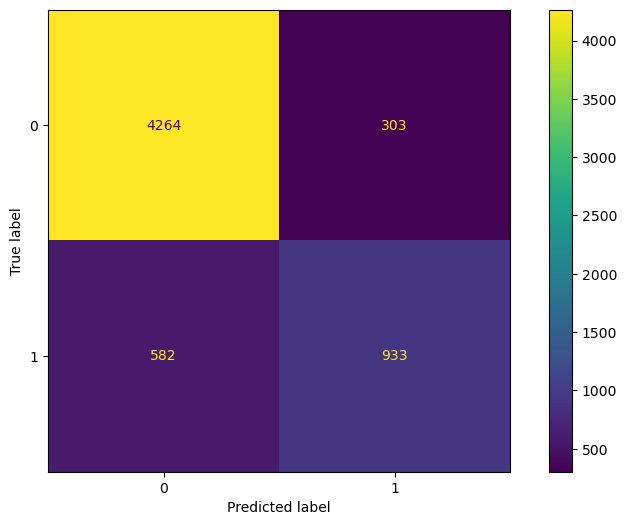

In [99]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(log_pipe, X_test, y_test)

# Since the true label and predicted label axes are shown, it is easier to interpret the plot.
# TP, FP, TN, and FN are extracted from the confusion matrix.

# from slearn.metrics import plot_confusion_matrix
# plot_confusion_matrix(log_pipe, X_test, y_test)


In [100]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [101]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

Test_Set
[[4264  303]
 [ 582  933]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.91      4567
           1       0.75      0.62      0.68      1515

    accuracy                           0.85      6082
   macro avg       0.82      0.77      0.79      6082
weighted avg       0.85      0.85      0.85      6082


Train_Set
[[16962  1304]
 [ 2467  3595]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     18266
           1       0.73      0.59      0.66      6062

    accuracy                           0.84     24328
   macro avg       0.80      0.76      0.78     24328
weighted avg       0.84      0.84      0.84     24328



### GridSearchCV

In [102]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

C = [0.01, 0.1, 1]  # As C increases, regularization decreases, which is the inverse of alpha
class_weight= ["balanced", None] 
# We can use class_weight="balanced" to balance classes in imbalanced datasets. 
# By using class_weight="balanced", we ensure that the model focuses more on correctly classifying examples of the underrepresented class,
# which can often increase the recall of that class.

# To avoid solver-penalty errors
param_grid = [
    {
        "logistic__penalty" : ['l2', 'none'],
        "logistic__C" : C,
        "logistic__class_weight": class_weight,
        "logistic__solver": ['sag', 'lbfgs']
    },
    {
        "logistic__penalty" : ['l1', 'l2'],
        "logistic__C" : C,
        "logistic__class_weight": class_weight,
        "logistic__solver": ['liblinear', 'saga']
    }
]

cv = StratifiedKFold(n_splits = 10) # Can be used for unbalanced data

grid_model = GridSearchCV(estimator=log_pipe,
                          param_grid=param_grid,
                          cv=cv,
                          scoring = "recall",   # By default, it maximizes the score for class 1. If you want to maximize for class 0, use recall_0 = make_scorer(recall_score, pos_label =0)
                          n_jobs = -1,
                          return_train_score=True)


# GridSearchCV also performs Cross Validation, so to obtain validation and train set scores,
# we specify return_train_score=True. (scoring only returns the metric score you specify)


**penalty:** Specifies which regularization parameter is applied in the background. Default is `l2`; # `l1`: Lasso, `l2`: Ridge

**C:** The strength of regularization, similar to alpha in ridge and lasso; as C increases, regularization decreases, which is the inverse of alpha. For example, if overfitting occurs, the value of C should be decreased.

**balanced:** We use `class_weight="balanced"` to balance classes in imbalanced datasets. When the data is balanced, the model tries to increase the recall score of the minority class by improving the precision score for that class.

**solver:** In our model, optimization occurs in the background to minimize error. The solver applies different algorithms during the optimization phase. Default: `lbfgs`

**StratifiedK-fold cross-validation:**

- This method is a variant of K-Fold cross-validation.

- While normal K-Fold cross-validation randomly divides the data into K equal-sized subsets, StratifiedKFold splits the data in such a way that each subset contains nearly the same proportion of samples from each class (or target variable) as the original dataset.

- This ensures that the proportion of each class is preserved in both the training and test sets, which is particularly useful when the target variable is imbalanced.

- In summary, StratifiedKFold is suitable for datasets with class imbalance.

In [103]:
log_pipe.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('logistic', LogisticRegression())],
 'verbose': False,
 'scaler': StandardScaler(),
 'logistic': LogisticRegression(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'logistic__C': 1.0,
 'logistic__class_weight': None,
 'logistic__dual': False,
 'logistic__fit_intercept': True,
 'logistic__intercept_scaling': 1,
 'logistic__l1_ratio': None,
 'logistic__max_iter': 100,
 'logistic__multi_class': 'auto',
 'logistic__n_jobs': None,
 'logistic__penalty': 'l2',
 'logistic__random_state': None,
 'logistic__solver': 'lbfgs',
 'logistic__tol': 0.0001,
 'logistic__verbose': 0,
 'logistic__warm_start': False}

In [104]:
grid_model.fit(X_train, y_train)

/home/elnurak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1182: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/home/elnurak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1192: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/elnurak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1182: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/home/elnurak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1192: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/elnurak/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1182: FutureWarning: `penalty='none'`has been depreca

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic', LogisticRegression())]),
             n_jobs=-1,
             param_grid=[{'logistic__C': [0.01, 0.1, 1],
                          'logistic__class_weight': ['balanced', None],
                          'logistic__penalty': ['l2', 'none'],
                          'logistic__solver': ['sag', 'lbfgs']},
                         {'logistic__C': [0.01, 0.1, 1],
                          'logistic__class_weight': ['balanced', None],
                          'logistic__penalty': ['l1', 'l2'],
                          'logistic__solver': ['liblinear', 'saga']}],
             return_train_score=True, scoring='recall')

In [105]:
grid_model.best_params_

# `best_params_` returns the best hyperparameter values among all the hyperparameter spaces defined in `param_grid`.


{'logistic__C': 0.01,
 'logistic__class_weight': 'balanced',
 'logistic__penalty': 'l1',
 'logistic__solver': 'liblinear'}

In [106]:
grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic',
                 LogisticRegression(C=0.01, class_weight='balanced',
                                    penalty='l1', solver='liblinear'))])

In [107]:
grid_model.best_score_

0.8482332088233535

In [108]:
grid_model.best_index_

24

In [109]:
pd.DataFrame(grid_model.cv_results_).loc[1, ["mean_test_score", "mean_train_score"]]

# The "mean_test_score" and "mean_train_score" for the relevant DataFrame index are extracted and compared to evaluate overfitting and underfitting.

# Since GridSearchCV also performs cross-validation, there is no need for additional cross-validation.

# The scores obtained here are the scores for the scoring metric provided within GridSearchCV.


mean_test_score     0.838501
mean_train_score     0.84138
Name: 1, dtype: object

In [110]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)

# For the label 0:
# Precision of 0.94 means that 94% of my predictions were accurate.

# Recall of 0.79 means that I correctly identified 79% of the instances that were actually of class 0.

# The F1 score provides the harmonic mean of precision and recall, so it should be interpreted according to your target metric (recall, precision). Interpreting it alone might lead to misleading conclusions.

# In an imbalanced dataset, the weighted average metric provides a fairer performance measurement by considering class distribution.
# On the other hand, the macro average metric provides an average assuming that each class is equally important, regardless of class distribution.


Test_Set
[[3625  942]
 [ 237 1278]]
              precision    recall  f1-score   support

           0       0.94      0.79      0.86      4567
           1       0.58      0.84      0.68      1515

    accuracy                           0.81      6082
   macro avg       0.76      0.82      0.77      6082
weighted avg       0.85      0.81      0.82      6082


Train_Set
[[14444  3822]
 [  910  5152]]
              precision    recall  f1-score   support

           0       0.94      0.79      0.86     18266
           1       0.57      0.85      0.69      6062

    accuracy                           0.81     24328
   macro avg       0.76      0.82      0.77     24328
weighted avg       0.85      0.81      0.82     24328



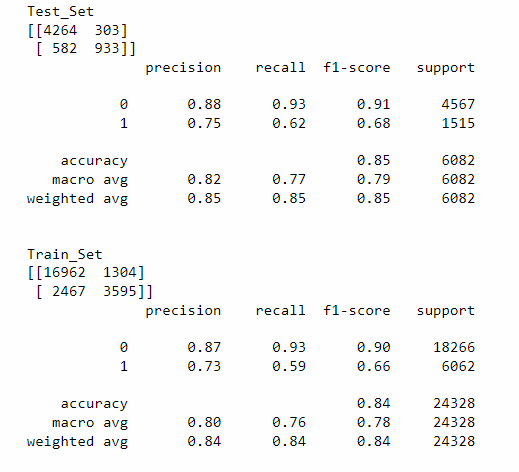

1. **Macro Average (Macro Avg):**
   - The F1 score (or another metric) is calculated for each class.
   - These values are summed and then divided by the number of classes to obtain the average.
   - Macro average represents cases where all classes are equally important.
   - In imbalanced datasets, the performance of classes with fewer examples is also considered equally.
   - Use this metric when you want to evaluate all classes equally.

2. **Weighted Average (Weighted Avg):**
   - The F1 score (or another metric) is calculated for each class.
   - These values are averaged, weighted by the number of examples in each class.
   - Weighted average takes into account the importance of classes based on their number of examples.
   - The performance of classes with more examples is given more weight.

- If you believe that the performance of all classes is equally important, you should look at the "Macro Avg" metric.
- However, if you think that some classes with more examples are more critical, you should focus on the "Weighted Avg" metric.

- **Micro Recall:** This method calculates a single aggregate metric by summing up the total predictions across all classes. In other words, it uses the total true positives (TP) and false negatives (FN) across all classes. This shows how the model performs overall across all classes. It is often preferred when class imbalance is not a significant concern.

- **Macro Recall:** This approach calculates recall for each class individually and then takes the simple average of these recall values. This method treats all classes equally and evaluates the performance of each class with equal weight. It is useful in cases of class imbalance as it does not ignore the performance of minority classes.

**General Differences Between Micro and Macro:**

- **Micro-level metrics** focus on the overall performance across all classes. This indicates the model’s general performance but might overlook class imbalances.

- **Macro-level metrics** evaluate the performance of each class separately and average these values. This approach treats the performance of all classes with equal importance, meaning that the performance of minority classes is given as much weight as larger classes.

**When to Use Which:**

- **Micro-level metrics** are useful when you want to measure the overall model performance, particularly when class imbalance is not a critical issue.

- **Macro-level metrics** should be used when you want to evaluate the performance of all classes with equal importance, especially in situations with imbalanced datasets where the performance of minority classes is significant.

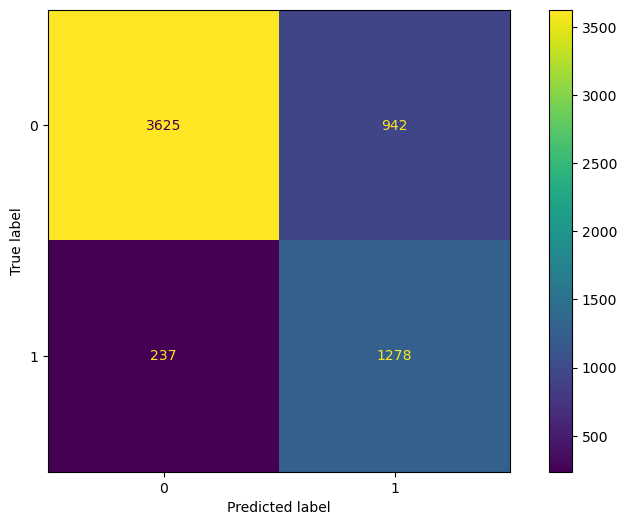

In [111]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(grid_model, X_test, y_test)

# The axes showing true labels and predicted labels make it easier to interpret.
# TP, FP, TN, FN can be extracted from the confusion matrix.

# Alternatively, you can use:
# plot_confusion_matrix(grid_model, X_test, y_test);


**Average Precision** evaluates how well the model predicts positive examples (precision) and also how much of the true positive examples it captures (recall) by combining these metrics.

This metric can be used similarly to the ROC Curve (Receiver Operating Characteristic Curve) and AUC (Area Under the Curve), but in imbalanced datasets, the Precision-Recall Curve and Average Precision are often more informative.

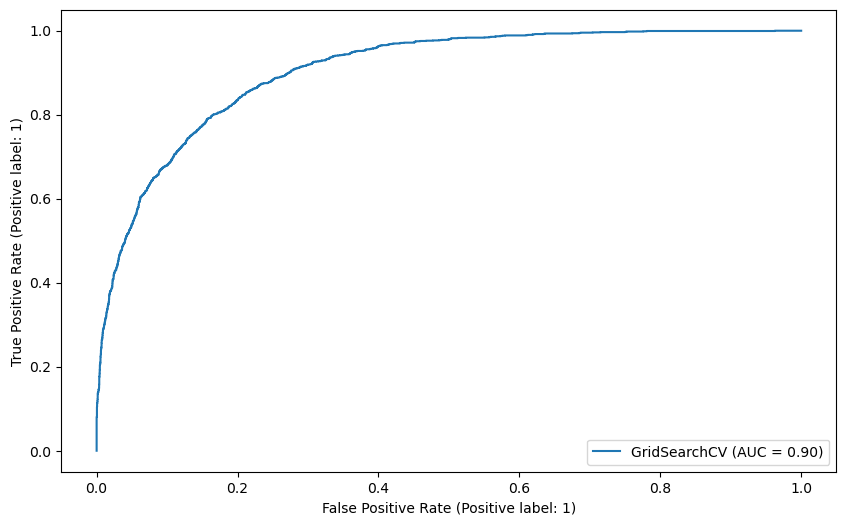

In [112]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(grid_model, X_test, y_test)

# from sklearn.metrics import plot_roc_curve
# plot_roc_curve(grid_model, X_test, y_test); 

In [113]:
```python
from sklearn.metrics import PrecisionRecallDisplay

PrecisionRecallDisplay.from_estimator(grid_model, X_test, y_test)

# While both AUC score and Average Precision score may yield similar values in balanced datasets,
# it is a good practice to use AUC for balanced datasets and Average Precision scores for imbalanced datasets.

# Alternatively, you can use:
# plot_precision_recall_curve(grid_model, X_test, y_test);
```

SyntaxError: invalid syntax (2961529435.py, line 1)

# Implement K Nearest Neigbors (KNN)

**Tell me who your neighbors are, and I’ll tell you who you are!!**

**Basic Principle:** KNN (K-Nearest Neighbors) is based on the idea that a data point is similar to its "neighbors." When making a prediction for a data point, the KNN algorithm finds the 'K' closest data points to this data point and makes a prediction based on the features of these neighbors.

**Classification and Regression:** KNN can be used for both classification and regression problems. For classification, the most common class among the nearest 'K' neighbors is the predicted class. For regression, the predicted value is the average of the 'K' neighbors' values.

**Distance Measurement:** The performance of KNN depends on how neighbors are chosen and the metric used to measure distances between them. Commonly used distance metrics include Euclidean, Manhattan, and Minkowski distances.

**Choosing K Value:** The value of K is an important parameter affecting the model's complexity and performance. A small K value may lead to overfitting, while a large K value can cause the model to generalize too much (underfitting). The best K value is usually determined using cross-validation.

**Scaling:** KNN is sensitive to the scale of features. If there are large differences in scales among features, a lack of scaling can negatively impact the model's performance. Therefore, it is generally recommended to normalize or standardize features before applying KNN.

**Euclidean Distance:** Measures the straight-line distance between two points. This is typically considered the most 'natural' distance in a two-dimensional plane. Euclidean distance can also be viewed as the shortest path between two points.

**Manhattan Distance:** Measures the distance between two points by moving horizontally and vertically on a grid.

**Minkowski Distance:** Euclidean and Manhattan distances are special cases of the more general Minkowski distance.

The parameter **p** determines the type of Minkowski distance: **p = 2** yields Euclidean distance; **p = 1** yields Manhattan distance.

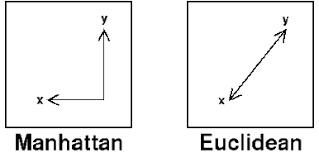

In [114]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]

knn_pipe = Pipeline(steps=operations)

knn_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [115]:
y_pred = knn_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [116]:
y_pred_proba = knn_pipe.predict_proba(X_test)

In [117]:
pd.DataFrame(y_pred_proba)

# Since in our model we used weights=uniform and the number of neighbors is 5, for the 1st observation:
# Out of the 5 neighbors, 2 belong to class 1 (0.4) and 3 belong to class 0 (0.6).
# Therefore, the probability is 0.6, and the model will assign the class 0 based on this probability.


,0,1
0,1.0,0.0
1,0.6,0.4
2,1.0,0.0
3,0.8,0.2
4,1.0,0.0
...,...,...
6077,1.0,0.0
6078,1.0,0.0
6079,1.0,0.0
6080,0.2,0.8


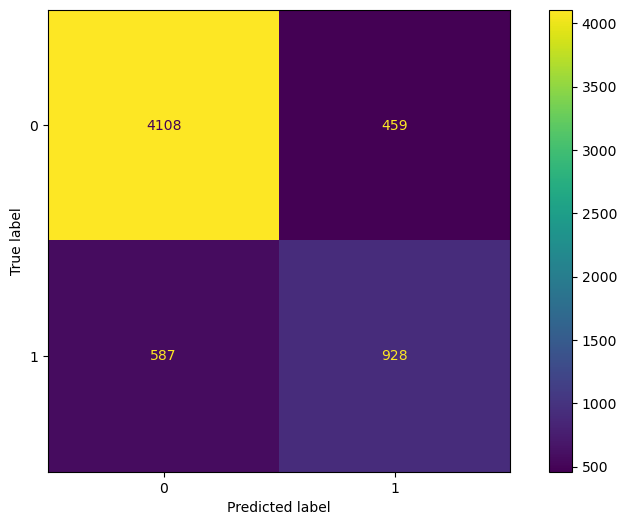

In [118]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(knn_pipe, X_test, y_test)

# plot_confusion_matrix(knn_pipe, X_test, y_test);

In [119]:
eval_metric(knn_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[4108  459]
 [ 587  928]]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4567
           1       0.67      0.61      0.64      1515

    accuracy                           0.83      6082
   macro avg       0.77      0.76      0.76      6082
weighted avg       0.82      0.83      0.83      6082


Train_Set
[[17089  1177]
 [ 1806  4256]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92     18266
           1       0.78      0.70      0.74      6062

    accuracy                           0.88     24328
   macro avg       0.84      0.82      0.83     24328
weighted avg       0.87      0.88      0.88     24328



## Elbow Method for Choosing Reasonable K Values

For big k values the errors will increase, small k values overfitting occurs.

**for optimal k**;

1-Elbow metodu

2-gridsearch

In [120]:
test_error_rates = []

for k in range(1, 10):
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]

    knn_pipe_model = Pipeline(steps=operations)
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring=['recall'], cv=5)
    
    recall_mean = scores["test_recall"].mean() 
    
    test_error = 1 - recall_mean
    
    test_error_rates.append(test_error)

# To select the optimal K value, if our data is balanced, we can use the accuracy metric, 
# and if the data is imbalanced, we use the recall of the target class.

# For each number of neighbors (from 1 to 10), we first find the recall score and then subtract 
# this score from 1 to get the error score for each K value.

# IMPORTANT NOTE: Finding the optimal K value using the test data (hold-out set) could lead to data leakage. 
# Instead, we should use cross-validation on our training data and decide based on the average error scores 
# of the validation set from cross-validation.

# When evaluating the model's performance and determining the best parameters (in this case, the best K value), 
# we should only use the training data. Tuning parameters using the test data can lead to data leakage. 
# Therefore, we should use cross-validation to assess the model's performance and determine the best parameters. 
# This approach provides a more accurate reflection of the model's true performance.


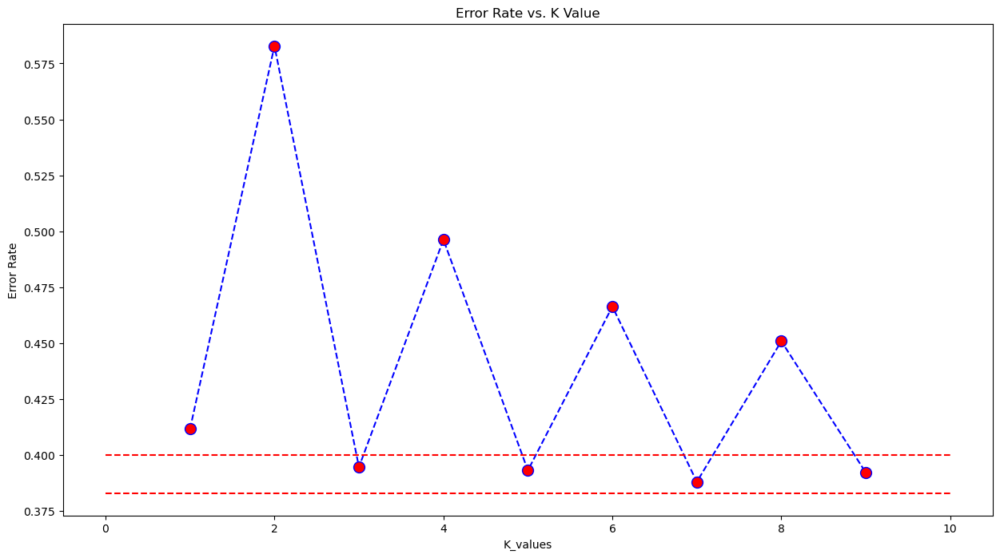

In [121]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.4, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.383, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

# visualizing the cound error scors.

## Overfiting and underfiting control for k values

In [122]:
test_error_rates = []
train_error_rates = []

for k in range(1, 10):
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    
    knn_pipe_model.fit(X_train, y_train)
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring=['recall'], cv=5, return_train_score=True)
    
    recall_test_mean = scores["test_recall"].mean()
    recall_train_mean = scores["train_recall"].mean()

    test_error = 1 - recall_test_mean
    train_error = 1 - recall_train_mean
    
    test_error_rates.append(test_error)
    train_error_rates.append(train_error)
    
# The above code compares the average error rates of the validation and training data obtained from CV 
# with the same K values. This helps in assessing whether overfitting is occurring or not.


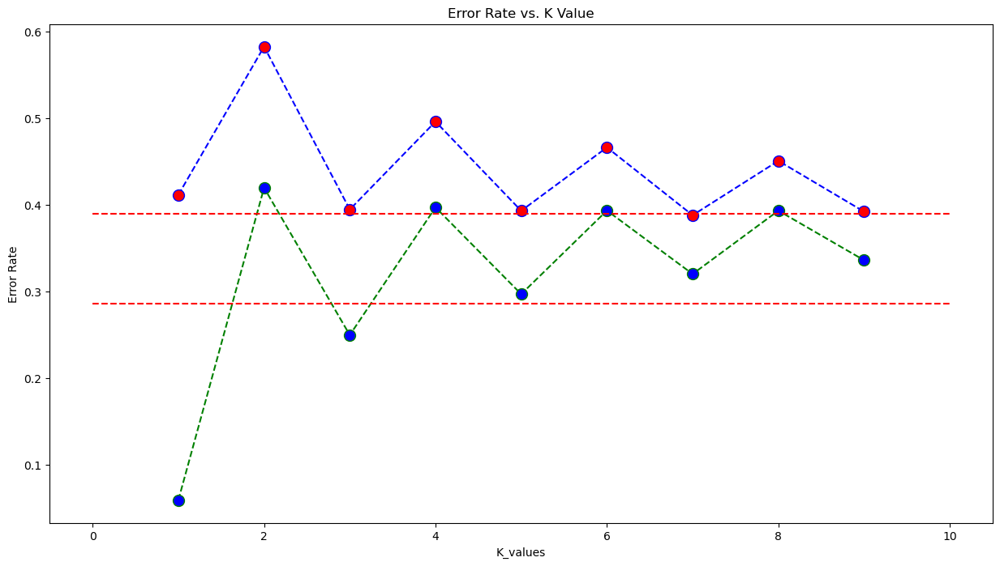

In [123]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.plot(range(1,10), train_error_rates, color='green', linestyle='--', marker='o',
         markerfacecolor='blue', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.39, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.286, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

# **Red lines represent validation data scores, while blue lines represent training data scores.**

## Scores by Various K Values

In [124]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=3))]
knn3 = Pipeline(steps=operations)

knn3.fit(X_train, y_train)
print('WITH K=3\n')
eval_metric(knn3, X_train, y_train, X_test, y_test)

WITH K=3

Test_Set
[[4070  497]
 [ 600  915]]
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      4567
           1       0.65      0.60      0.63      1515

    accuracy                           0.82      6082
   macro avg       0.76      0.75      0.75      6082
weighted avg       0.82      0.82      0.82      6082


Train_Set
[[17204  1062]
 [ 1506  4556]]
              precision    recall  f1-score   support

           0       0.92      0.94      0.93     18266
           1       0.81      0.75      0.78      6062

    accuracy                           0.89     24328
   macro avg       0.87      0.85      0.86     24328
weighted avg       0.89      0.89      0.89     24328



In [125]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=5))]
knn5 = Pipeline(steps=operations)

knn5.fit(X_train, y_train)
print('WITH K=5\n')
eval_metric(knn5, X_train, y_train, X_test, y_test)

WITH K=5

Test_Set
[[4108  459]
 [ 587  928]]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4567
           1       0.67      0.61      0.64      1515

    accuracy                           0.83      6082
   macro avg       0.77      0.76      0.76      6082
weighted avg       0.82      0.83      0.83      6082


Train_Set
[[17089  1177]
 [ 1806  4256]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92     18266
           1       0.78      0.70      0.74      6062

    accuracy                           0.88     24328
   macro avg       0.84      0.82      0.83     24328
weighted avg       0.87      0.88      0.88     24328



In [126]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
knn7 = Pipeline(steps=operations)

knn7.fit(X_train, y_train)
print('WITH K=7\n')
eval_metric(knn7, X_train, y_train, X_test, y_test)

WITH K=7

Test_Set
[[4150  417]
 [ 575  940]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4567
           1       0.69      0.62      0.65      1515

    accuracy                           0.84      6082
   macro avg       0.79      0.76      0.77      6082
weighted avg       0.83      0.84      0.83      6082


Train_Set
[[17040  1226]
 [ 1947  4115]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.91     18266
           1       0.77      0.68      0.72      6062

    accuracy                           0.87     24328
   macro avg       0.83      0.81      0.82     24328
weighted avg       0.87      0.87      0.87     24328



## Cross Validate For Optimal K Value

In [127]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
1,0.031268,0.376086,0.822441,0.870792,0.661111,0.770881,0.589109,0.685117,0.623037,0.725473
2,0.046876,0.295843,0.840937,0.869696,0.714286,0.768406,0.602310,0.682918,0.653536,0.723144
3,0.062230,0.405050,0.819564,0.870975,0.652651,0.773095,0.589109,0.682551,0.619254,0.725007
4,0.049736,0.294604,0.844636,0.868828,0.708029,0.768943,0.640264,0.677053,0.672444,0.720078
5,0.046870,0.343899,0.834772,0.868600,0.690299,0.768814,0.610561,0.675953,0.647986,0.719399
6,0.029030,0.328346,0.843814,0.868554,0.711610,0.766763,0.627063,0.679069,0.666667,0.720257
7,0.031234,0.359423,0.836005,0.870427,0.700772,0.770902,0.598023,0.682860,0.645333,0.724215
8,0.022652,0.415237,0.840526,0.867732,0.691099,0.764087,0.652389,0.678643,0.671186,0.718835
9,0.031246,0.327506,0.820724,0.869611,0.660377,0.769869,0.577558,0.679985,0.616197,0.722141
10,0.047050,0.373314,0.832237,0.869839,0.682657,0.769326,0.610561,0.682185,0.644599,0.723140


In [128]:
df_scores.mean()[2:]

test_accuracy      0.833566
train_accuracy     0.869506
test_precision     0.687289
train_precision    0.769109
test_recall        0.609695
train_recall       0.680633
test_f1            0.646024
train_f1           0.722169
dtype: float64

## Gridsearch Method for Choosing Reasonable K Values

In [129]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]
knn_model = Pipeline(steps=operations)

In [130]:
knn_model.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('knn', KNeighborsClassifier())],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 5,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [131]:
k_values= range(1,10)

In [132]:
param_grid = {"knn__n_neighbors": k_values, "knn__p": [1,2], "knn__weights": ['uniform', "distance"]}


# For KNN, the most important hyperparameters are:**
# 1. n_neighbors:** In binary models, it is important that this value is odd to avoid ties between classes. In multiclass datasets, whether it is odd or even does not matter.
# 2. weights:** `uniform` assigns equal weight to all neighbors, while `distance` assigns weights based on distance, giving more weight to closer neighbors.
# 3. p:** `p=2` corresponds to the Euclidean metric, `p=1` corresponds to the Manhattan metric, and `p=0` corresponds to the Minkowski metric.

In [135]:
knn_grid_model = GridSearchCV(knn_model, param_grid, cv=5, scoring = "recall", return_train_score=True, n_jobs=-1)

In [136]:
knn_grid_model.fit(X_train, y_train)

# GridSearchCV will always return the maximum metric score that corresponds to the lowest error score.
# Choosing the `n_neighbors` value found after GridSearchCV** can be costly, so using the elbow method to select the best `n_neighbors` value is considered best practice.

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__n_neighbors': range(1, 10), 'knn__p': [1, 2],
                         'knn__weights': ['uniform', 'distance']},
             return_train_score=True, scoring='recall')

In [137]:
knn_grid_model.best_params_

{'knn__n_neighbors': 7, 'knn__p': 2, 'knn__weights': 'uniform'}

In [139]:
knn_grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=7))])

In [140]:
knn_grid_model.best_index_

26

In [141]:
pd.DataFrame(knn_grid_model.cv_results_).loc[32, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.596998
mean_train_score    0.653373
Name: 32, dtype: object

In [142]:
knn_grid_model.best_score_

0.6120075692647584

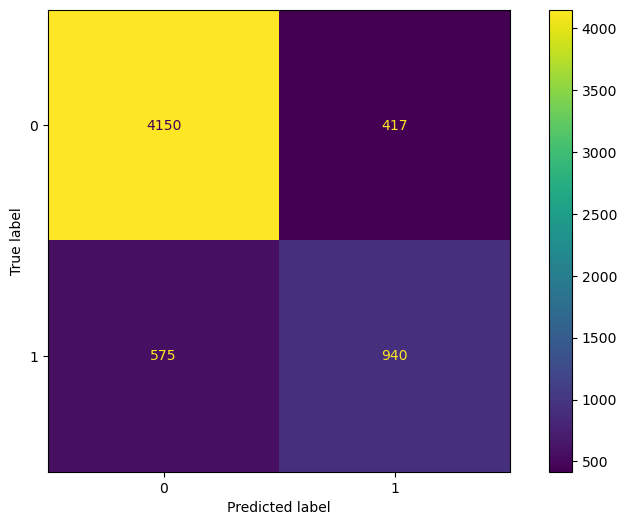

In [143]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(knn_grid_model, X_test, y_test)

# plot_confusion_matrix(knn_grid_model, X_test, y_test)

In [144]:
print('WITH K=7\n')
eval_metric(knn_grid_model, X_train, y_train, X_test, y_test)

WITH K=9

Test_Set
[[4150  417]
 [ 575  940]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4567
           1       0.69      0.62      0.65      1515

    accuracy                           0.84      6082
   macro avg       0.79      0.76      0.77      6082
weighted avg       0.83      0.84      0.83      6082


Train_Set
[[17040  1226]
 [ 1947  4115]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.91     18266
           1       0.77      0.68      0.72      6062

    accuracy                           0.87     24328
   macro avg       0.83      0.81      0.82     24328
weighted avg       0.87      0.87      0.87     24328



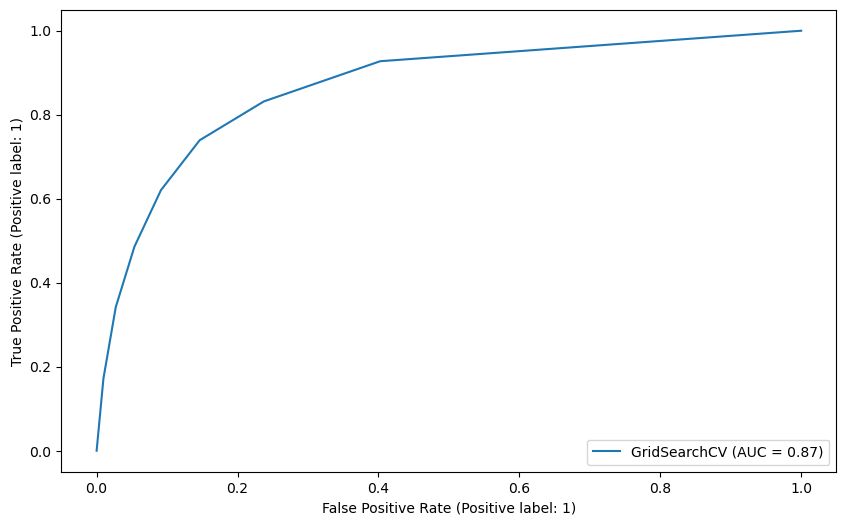

In [145]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(knn_grid_model, X_test, y_test)

# plot_roc_curve(knn_grid_model, X_test, y_test)

In [146]:
y_pred_proba = knn_grid_model.predict_proba(X_test)
roc_auc_score(y_test, y_pred_proba[:,1])

0.8670983761393438

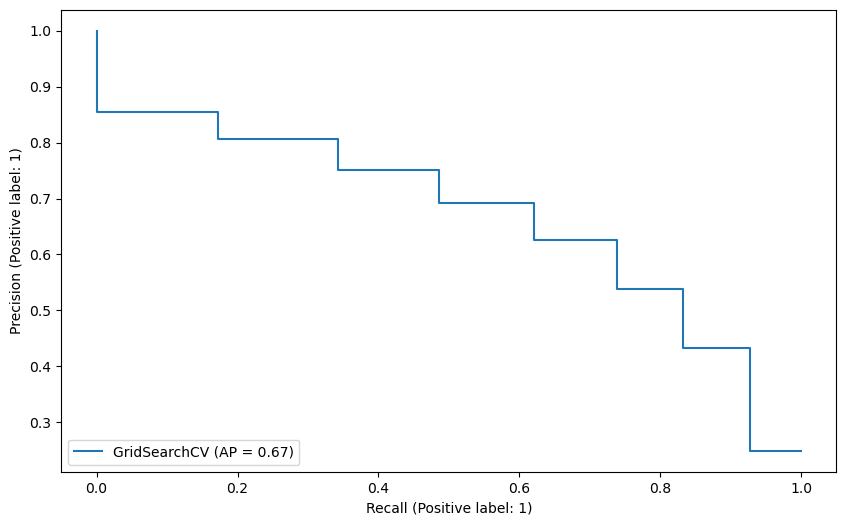

In [147]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(knn_grid_model, X_test, y_test)

# plot_precision_recall_curve(knn_grid_model, X_test, y_test);

# Implement Support Vector Machine

**SVM (Support Vector Machine)** is a classification and regression algorithm.

- It is suitable for small to medium-sized datasets.

- Since it is a distance-based model, it is sensitive to scaling. Data needs to be scaled.

**The core concept of SVM** is to find a hyperplane (a high-dimensional plane) that best separates the data for classification.

- SVM represents the data in a space and uses one or more hyperplanes to define boundaries. A hyperplane is the best dividing line that separates the data into two classes. This line should provide the largest margin between the classes. SVM aims to maximize this margin distance.

- SVM also uses kernel functions when working with non-linear data. Kernel functions allow data to be represented in high-dimensional spaces. This way, SVM provides higher accuracy in classifying more complex and non-linear data.

https://towardsdatascience.com/hyperparameter-tuning-for-support-vector-machines-c-and-gamma-parameters-6a5097416167
    
https://medium.com/grabngoinfo/support-vector-machine-svm-hyperparameter-tuning-in-python-a65586289bcb

**So, What Happens with Multiclass Classification?**

The SVM algorithm is designed for binary classification. However, it can also be used for multiclass classification problems. In multiclass classification, SVM uses multiple binary classifiers to work.

This approach is known as "one-vs-all (OvA)" or "one-vs-one (OvO)".

- **OvA Approach:** In the One-vs-All method, each class is treated separately from all other classes. A classifier is built to distinguish one class from the rest. For example, in a 3-class classification problem, one classifier is built to separate class 1 from the others, another to separate class 2 from the others, and finally, another to separate class 3 from the others. The outputs of the classifiers are combined to determine which class the data belongs to.

- **OvO Approach:** In the One-vs-One method, a classifier is created for each pair of classes. For instance, in a 3-class classification problem, a classifier is built to distinguish between class 1 and class 2, another between class 1 and class 3, and a third between class 2 and class 3. The outputs of these classifiers are combined to determine the most frequently occurring class.

Both approaches aim to extend the binary classification capability of SVM to handle multiple classes by using different strategies for combining the results of binary classifiers.

https://www.baeldung.com/cs/svm-multiclass-classification

https://www.analyticsvidhya.com/blog/2021/05/multiclass-classification-using-svm/

https://towardsdatascience.com/multiclass-classification-with-support-vector-machines-svm-kernel-trick-kernel-functions-f9d5377d6f02    

In [148]:
from sklearn.svm import SVC

operations = [("scaler", StandardScaler()), ("svm", SVC())]

svm_pipe = Pipeline(steps=operations)

svm_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('svm', SVC())])

In [149]:
eval_metric(svm_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[4258  309]
 [ 602  913]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      4567
           1       0.75      0.60      0.67      1515

    accuracy                           0.85      6082
   macro avg       0.81      0.77      0.79      6082
weighted avg       0.84      0.85      0.84      6082


Train_Set
[[17164  1102]
 [ 2467  3595]]
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     18266
           1       0.77      0.59      0.67      6062

    accuracy                           0.85     24328
   macro avg       0.82      0.77      0.79     24328
weighted avg       0.85      0.85      0.85     24328



In [150]:
operations = [("scaler", StandardScaler()), ("SVC", SVC())]
svm_pipe = Pipeline(steps=operations)

scores = cross_validate(svm_pipe, X_train, y_train, scoring = ['accuracy', 'precision','recall','f1'], cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy     0.845569
test_precision    0.745598
test_recall       0.577200
test_f1           0.650517
dtype: float64

## SVC GridsearchCV

**C:** This is a regularization parameter. A larger value of C reduces classification errors but increases the risk of overfitting. A smaller C might lead to better generalization performance. It helps determine the hard margin versus soft margin; if the model overfits, C should be reduced.

**gamma:** This is a kernel parameter. When data is non-linear, we use kernels to separate the data, and gamma controls the width of the kernel. For RBF, polynomial, and sigmoid kernels, gamma influences how much influence a single training example has.

- **Low gamma** defines a point's influence to be broader, resulting in a smoother decision boundary.
- **High gamma** causes the model to consider only very close points, leading to a more complex and circular decision boundary.

Using `gamma='scale'` scales the data so that each feature has the same weight for gamma, regardless of its original scale. If the model overfits, gamma should be lowered; if it underfits, gamma should be increased.

**kernel:** Determines the function used to transform the data into higher-dimensional space. Options include linear, polynomial, RBF (Gaussian), and sigmoid kernels.

**degree:** For polynomial kernels, this parameter defines the degree of the polynomial. The default value is 3.

In [151]:
svm_pipe.get_params() ## how and what hyperparameters we should give in Param grid

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('SVC', SVC())],
 'verbose': False,
 'scaler': StandardScaler(),
 'SVC': SVC(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'SVC__C': 1.0,
 'SVC__break_ties': False,
 'SVC__cache_size': 200,
 'SVC__class_weight': None,
 'SVC__coef0': 0.0,
 'SVC__decision_function_shape': 'ovr',
 'SVC__degree': 3,
 'SVC__gamma': 'scale',
 'SVC__kernel': 'rbf',
 'SVC__max_iter': -1,
 'SVC__probability': False,
 'SVC__random_state': None,
 'SVC__shrinking': True,
 'SVC__tol': 0.001,
 'SVC__verbose': False}

In [156]:
param_grid = {"SVC__C":[0.01, 1],
             "SVC__gamma":[0.1, 0.3],
             "SVC__kernel":["rbf", "linear"]}

In [157]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(class_weight="balanced"))]
pipe_model = Pipeline(steps=operations)

svm_model_grid = GridSearchCV(pipe_model, param_grid, scoring='recall_macro', cv=5)

**class_weight="balanced"** setting assigns weights to classes inversely proportional to their frequencies. This gives more importance to less represented classes (minority classes) during model training, helping the model to better recognize these classes.

In [158]:
svm_model_grid.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC', SVC(class_weight='balanced'))]),
             param_grid={'SVC__C': [0.01, 1], 'SVC__gamma': [0.1, 0.3],
                         'SVC__kernel': ['rbf', 'linear']},
             scoring='recall_macro')>

In [159]:
svm_model_grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC', SVC(class_weight='balanced'))]),
             param_grid={'SVC__C': [0.01, 1], 'SVC__gamma': [0.1, 0.3],
                         'SVC__kernel': ['rbf', 'linear']},
             scoring='recall_macro')

In [160]:
svm_model_grid.best_score_

0.7976704962563932

In [161]:
svm_model_grid.best_params_

{'SVC__C': 1, 'SVC__gamma': 0.1, 'SVC__kernel': 'rbf'}

In [162]:
svm_model_grid.best_index_

4

In [163]:
eval_metric(svm_model_grid, X_train, y_train, X_test, y_test)

Test_Set
[[3655  912]
 [ 290 1225]]
              precision    recall  f1-score   support

           0       0.93      0.80      0.86      4567
           1       0.57      0.81      0.67      1515

    accuracy                           0.80      6082
   macro avg       0.75      0.80      0.76      6082
weighted avg       0.84      0.80      0.81      6082


Train_Set
[[14898  3368]
 [  593  5469]]
              precision    recall  f1-score   support

           0       0.96      0.82      0.88     18266
           1       0.62      0.90      0.73      6062

    accuracy                           0.84     24328
   macro avg       0.79      0.86      0.81     24328
weighted avg       0.88      0.84      0.85     24328



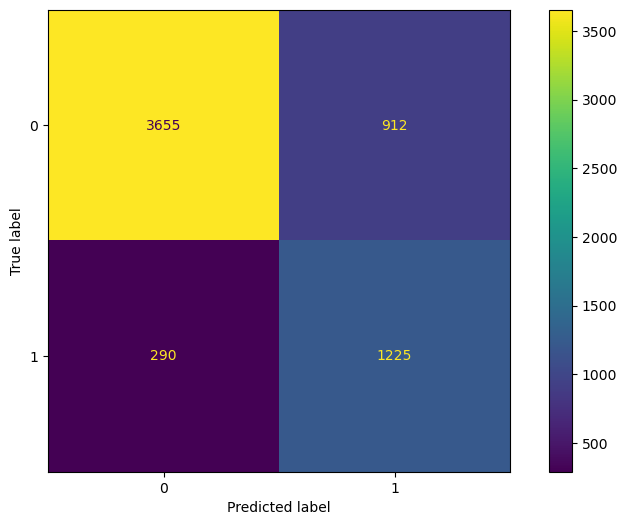

In [164]:
ConfusionMatrixDisplay.from_estimator(svm_model_grid, X_test, y_test)

# **True label** and **predicted label** axes are shown, making interpretation easier. TP, FP, TN, and FN are derived from the confusion matrix.

# plot_confusion_matrix(svm_model_grid, X_test, y_test);

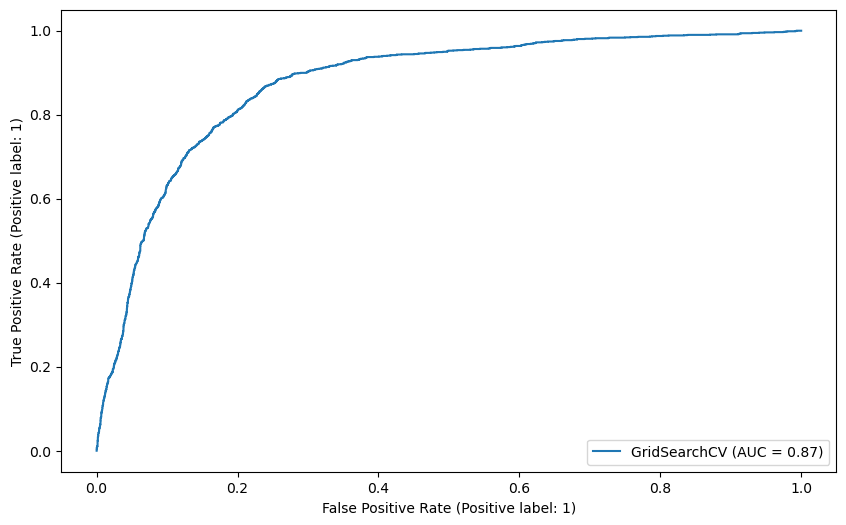

In [165]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(svm_model_grid, X_test, y_test)

# from sklearn.metrics import plot_roc_curve
# plot_roc_curve(svm_model_grid, X_test, y_test); 

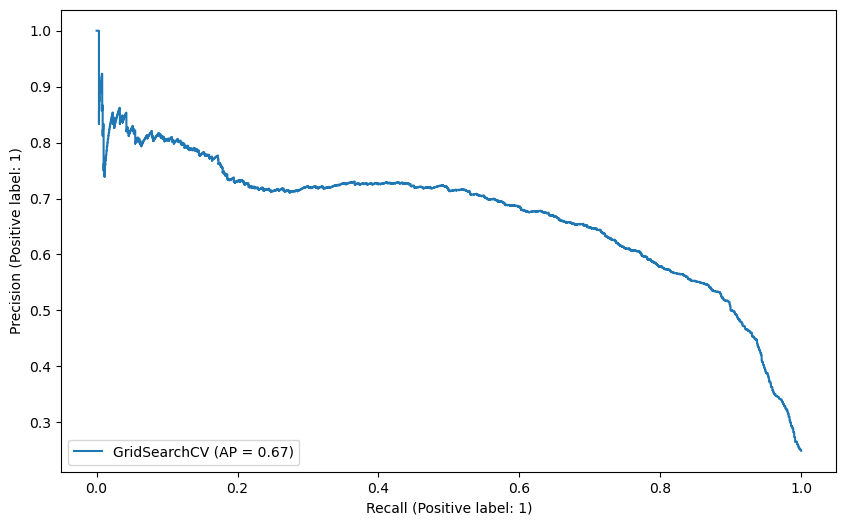

In [166]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(svm_model_grid, X_test, y_test)

# from sklearn.metrics import plot_precision_recall_curve

# plot_precision_recall_curve(svm_model_grid, X_test, y_test);

# While both AUC score and Average Precision score yield similar values for balanced datasets, 
# it is good practice to use AUC for balanced datasets and Average Precision scores for imbalanced datasets.

Logistic Model

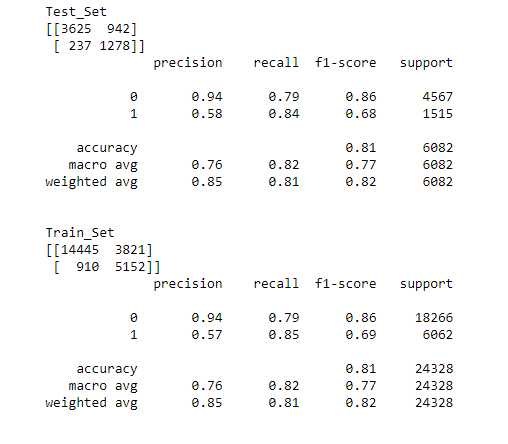

KNN Model

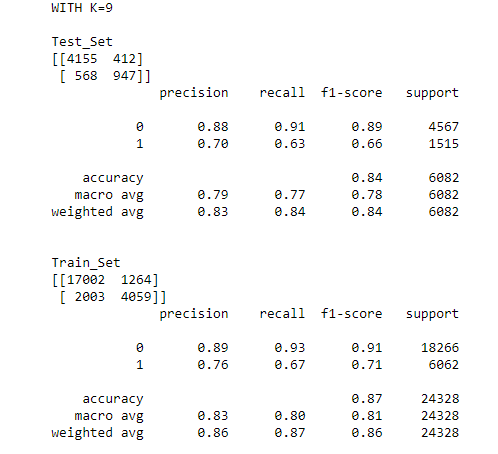

SVM Model
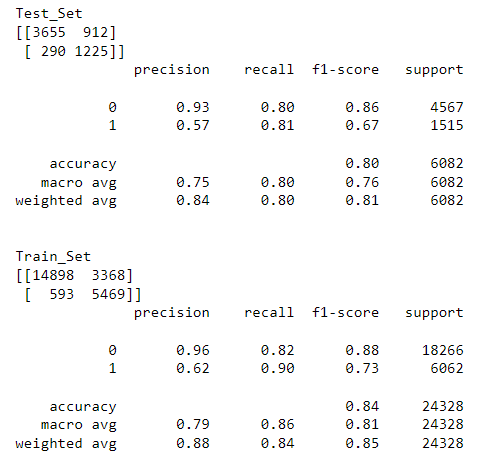

# <p style="background-color:green;font-family:newtimeroman;font-size:100%;color:white;text-align:center;border-radius:20px 20px;"><b>Thanks - Hoping it will be usefull</b></p>
![](https://www.techproeducation.com/logo/headerlogo.svg)

<b>If you want to be the first to know about the latest updates, please don't forget to follow us. </b>[YouTube](https://www.youtube.com/c/techproeducation) | [Instagram](https://www.instagram.com/techproeducation) | [Facebook](https://www.facebook.com/techproeducation) | [Telegram](https://t.me/joinchat/HH2qRvA-ulh4OWbb) | [Whatsapp](https://api.whatsapp.com/send/?phone=%2B15853042959&text&type=phone_number&app_absent=0) | [LinkedIn](https://www.linkedin.com/company/techproeducation/mycompany/) |